In [91]:
#basic imports
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error,mean_squared_log_error

In [2]:
train_df = pd.read_csv('train.csv',index_col=0)
test_df = pd.read_csv('test.csv',index_col=0)

In [3]:
train_df.head()

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount
id,,,,,,,,,,,,,,,,,,,,
0,19.0,Female,10049.0,Married,1.0,Bachelor's,Self-Employed,22.598761,Urban,Premium,2.0,17.0,372.0,5.0,2023-12-23 15:21:39.134960,Poor,No,Weekly,House,2869.0
1,39.0,Female,31678.0,Divorced,3.0,Master's,NaN,15.569731,Rural,Comprehensive,1.0,12.0,694.0,2.0,2023-06-12 15:21:39.111551,Average,Yes,Monthly,House,1483.0
2,23.0,Male,25602.0,Divorced,3.0,High School,Self-Employed,47.177549,Suburban,Premium,1.0,14.0,NaN,3.0,2023-09-30 15:21:39.221386,Good,Yes,Weekly,House,567.0
3,21.0,Male,141855.0,Married,2.0,Bachelor's,NaN,10.938144,Rural,Basic,1.0,0.0,367.0,1.0,2024-06-12 15:21:39.226954,Poor,Yes,Daily,Apartment,765.0
4,21.0,Male,39651.0,Single,1.0,Bachelor's,Self-Employed,20.376094,Rural,Premium,0.0,8.0,598.0,4.0,2021-12-01 15:21:39.252145,Poor,Yes,Weekly,House,2022.0


In [4]:
#target - > premium amount
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1200000 entries, 0 to 1199999
Data columns (total 20 columns):
 #   Column                Non-Null Count    Dtype  
---  ------                --------------    -----  
 0   Age                   1181295 non-null  float64
 1   Gender                1200000 non-null  object 
 2   Annual Income         1155051 non-null  float64
 3   Marital Status        1181471 non-null  object 
 4   Number of Dependents  1090328 non-null  float64
 5   Education Level       1200000 non-null  object 
 6   Occupation            841925 non-null   object 
 7   Health Score          1125924 non-null  float64
 8   Location              1200000 non-null  object 
 9   Policy Type           1200000 non-null  object 
 10  Previous Claims       835971 non-null   float64
 11  Vehicle Age           1199994 non-null  float64
 12  Credit Score          1062118 non-null  float64
 13  Insurance Duration    1199999 non-null  float64
 14  Policy Start Date     1200000 non-null 

In [5]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 800000 entries, 1200000 to 1999999
Data columns (total 19 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Age                   787511 non-null  float64
 1   Gender                800000 non-null  object 
 2   Annual Income         770140 non-null  float64
 3   Marital Status        787664 non-null  object 
 4   Number of Dependents  726870 non-null  float64
 5   Education Level       800000 non-null  object 
 6   Occupation            560875 non-null  object 
 7   Health Score          750551 non-null  float64
 8   Location              800000 non-null  object 
 9   Policy Type           800000 non-null  object 
 10  Previous Claims       557198 non-null  float64
 11  Vehicle Age           799997 non-null  float64
 12  Credit Score          708549 non-null  float64
 13  Insurance Duration    799998 non-null  float64
 14  Policy Start Date     800000 non-null  object 
 15

In [6]:
train_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1181295.0,41.145563,13.539950,18.000000,30.000000,41.000000,53.000000,64.000000
Annual Income,1155051.0,32745.217777,32179.506124,1.000000,8001.000000,23911.000000,44634.000000,149997.000000
Number of Dependents,1090328.0,2.009934,1.417338,0.000000,1.000000,2.000000,3.000000,4.000000
Health Score,1125924.0,25.613908,12.203462,2.012237,15.918959,24.578648,34.527209,58.975914
Previous Claims,835971.0,1.002689,0.982840,0.000000,0.000000,1.000000,2.000000,9.000000
Vehicle Age,1199994.0,9.569889,5.776189,0.000000,5.000000,10.000000,15.000000,19.000000
Credit Score,1062118.0,592.924350,149.981945,300.000000,468.000000,595.000000,721.000000,849.000000
Insurance Duration,1199999.0,5.018219,2.594331,1.000000,3.000000,5.000000,7.000000,9.000000
Premium Amount,1200000.0,1102.544822,864.998859,20.000000,514.000000,872.000000,1509.000000,4999.000000


In [7]:
from ydata_profiling import ProfileReport
report = ProfileReport(train_df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

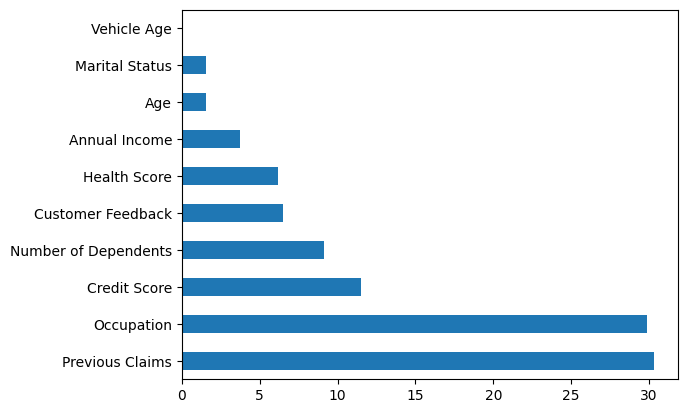

Previous Claims         30.335750
Occupation              29.839583
Credit Score            11.490167
Number of Dependents     9.139333
Customer Feedback        6.485333
Health Score             6.173000
Annual Income            3.745750
Age                      1.558750
Marital Status           1.544083
Vehicle Age              0.000500
dtype: float64


In [8]:
#missing
((train_df.isnull().sum()*100)/len(train_df)).sort_values(ascending=False).head(10).plot(kind='barh')
plt.show()
print(((train_df.isnull().sum()*100)/len(train_df)).sort_values(ascending=False).head(10))

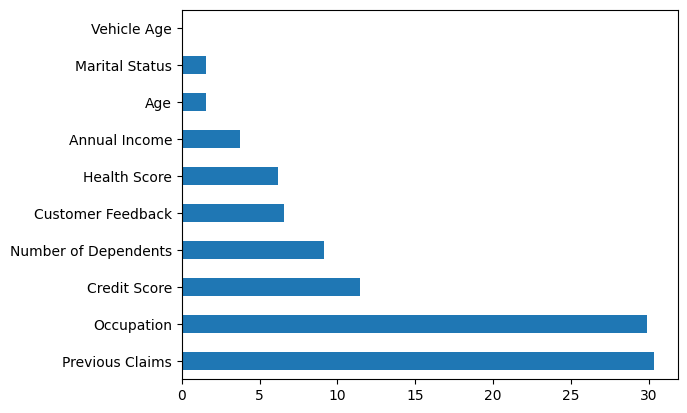

Previous Claims         30.350250
Occupation              29.890625
Credit Score            11.431375
Number of Dependents     9.141250
Customer Feedback        6.534500
Health Score             6.181125
Annual Income            3.732500
Age                      1.561125
Marital Status           1.542000
Vehicle Age              0.000375
dtype: float64


In [9]:
((test_df.isnull().sum()*100)/len(test_df)).sort_values(ascending=False).head(10).plot(kind='barh')
plt.show()
print(((test_df.isnull().sum()*100)/len(test_df)).sort_values(ascending=False).head(10))

In [10]:
#values which have more than 10% missing cant be filled correctly
train_df.drop(['Previous Claims','Occupation','Credit Score'],axis=1,inplace=True)
test_df.drop(['Previous Claims','Occupation','Credit Score'],axis=1,inplace=True)

In [11]:
#imputing number of dependents
train_df['Number of Dependents'].value_counts()

Number of Dependents
3.0    221475
4.0    220340
0.0    218124
2.0    215313
1.0    215076
Name: count, dtype: int64

In [12]:
train_df.select_dtypes('number').corr()['Number of Dependents']

Age                     0.001475
Annual Income           0.002135
Number of Dependents    1.000000
Health Score            0.005152
Vehicle Age             0.001232
Insurance Duration     -0.000265
Premium Amount         -0.000976
Name: Number of Dependents, dtype: float64

In [13]:
train_df['Policy Start Date'] = pd.to_datetime(train_df['Policy Start Date'])
test_df['Policy Start Date'] = pd.to_datetime(test_df['Policy Start Date'])

In [14]:
train_df['Policy days'] = (max(train_df['Policy Start Date']) - train_df['Policy Start Date']).dt.days
test_df['Policy days'] = (max(test_df['Policy Start Date']) - test_df['Policy Start Date']).dt.days

In [15]:
train_df['Policy days']

id
0           236
1           430
2           320
3            64
4           988
           ... 
1199995     470
1199996     705
1199997    1178
1199998    1061
1199999    1450
Name: Policy days, Length: 1200000, dtype: int64

In [16]:
train_df.select_dtypes('number').corr()['Number of Dependents']

Age                     0.001475
Annual Income           0.002135
Number of Dependents    1.000000
Health Score            0.005152
Vehicle Age             0.001232
Insurance Duration     -0.000265
Premium Amount         -0.000976
Policy days            -0.000298
Name: Number of Dependents, dtype: float64

In [17]:
train_df.drop('Policy Start Date',axis=1,inplace=True)
test_df.drop('Policy Start Date',axis=1,inplace=True)

In [18]:
#since no correlation is seen impute with median
train_df['Number of Dependents'].fillna(2.0,inplace=True)
test_df['Number of Dependents'].fillna(2.0,inplace=True)

In [19]:
#customer feedback
train_df['Customer Feedback'].value_counts()

Customer Feedback
Average    377905
Poor       375518
Good       368753
Name: count, dtype: int64

In [20]:
train_df['Customer Feedback'].fillna('Average',inplace=True)
test_df['Customer Feedback'].fillna('Average',inplace=True)

In [21]:
#fill in age
train_df['Age'].fillna(int(train_df['Age'].mean()),inplace=True)
test_df['Age'].fillna(int(train_df['Age'].mean()),inplace=True)

In [22]:
train_df.select_dtypes('number').corr()['Health Score']

Age                     0.000871
Annual Income           0.025530
Number of Dependents    0.004907
Health Score            1.000000
Vehicle Age             0.000316
Insurance Duration      0.002487
Premium Amount          0.014704
Policy days             0.001570
Name: Health Score, dtype: float64

In [23]:
train_df['Health Score'].mode()

0    19.927241
Name: Health Score, dtype: float64

In [24]:
train_df['Health Score'].fillna(19.927241,inplace=True)
test_df['Health Score'].fillna(19.927241,inplace=True)

In [25]:
train_df.groupby('Marital Status')['Age'].describe()

,count,mean,std,min,25%,50%,75%,max
Marital Status,,,,,,,,
Divorced,391764.0,41.122347,13.430665,18.0,30.0,41.0,53.0,64.0
Married,394316.0,41.177386,13.444187,18.0,30.0,41.0,53.0,64.0
Single,395391.0,41.132406,13.429750,18.0,30.0,41.0,53.0,64.0


In [26]:
train_df['Marital Status'].fillna('Married',inplace=True)
test_df['Marital Status'].fillna('Married',inplace=True)

In [27]:
train_df['Annual Income'].fillna(train_df['Annual Income'].median(),inplace=True)
test_df['Annual Income'].fillna(train_df['Annual Income'].median(),inplace=True)

In [28]:
train_df['Vehicle Age'].fillna(int(train_df['Vehicle Age'].mean()),inplace=True)
test_df['Vehicle Age'].fillna(int(train_df['Vehicle Age'].mean()),inplace=True)

In [29]:
train_df['Insurance Duration'].fillna(int(train_df['Insurance Duration'].mean()),inplace=True)
test_df['Insurance Duration'].fillna(int(train_df['Insurance Duration'].mean()),inplace=True)

In [30]:
#seperate columns
train_df.columns

Index(['Age', 'Gender', 'Annual Income', 'Marital Status',
       'Number of Dependents', 'Education Level', 'Health Score', 'Location',
       'Policy Type', 'Vehicle Age', 'Insurance Duration', 'Customer Feedback',
       'Smoking Status', 'Exercise Frequency', 'Property Type',
       'Premium Amount', 'Policy days'],
      dtype='object')

In [31]:
train_df.head()

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Health Score,Location,Policy Type,Vehicle Age,Insurance Duration,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount,Policy days
id,,,,,,,,,,,,,,,,,
0,19.0,Female,10049.0,Married,1.0,Bachelor's,22.598761,Urban,Premium,17.0,5.0,Poor,No,Weekly,House,2869.0,236
1,39.0,Female,31678.0,Divorced,3.0,Master's,15.569731,Rural,Comprehensive,12.0,2.0,Average,Yes,Monthly,House,1483.0,430
2,23.0,Male,25602.0,Divorced,3.0,High School,47.177549,Suburban,Premium,14.0,3.0,Good,Yes,Weekly,House,567.0,320
3,21.0,Male,141855.0,Married,2.0,Bachelor's,10.938144,Rural,Basic,0.0,1.0,Poor,Yes,Daily,Apartment,765.0,64
4,21.0,Male,39651.0,Single,1.0,Bachelor's,20.376094,Rural,Premium,8.0,4.0,Poor,Yes,Weekly,House,2022.0,988


In [32]:
num_cols = ['Age','Annual Income','Health Score','Vehicle Age','Insurance Duration','Policy days']
cat_cols = ['Number of Dependents','Gender','Marital Status','Education Level','Location','Policy Type','Customer Feedback','Smoking Status', 'Exercise Frequency', 'Property Type']
target_col = ['Premium Amount']

In [33]:
def plot_box(df):
    numerical_cols =['Age','Annual Income','Health Score','Vehicle Age','Insurance Duration','Policy days']
    num_plots = len(numerical_cols)
    nrows = (num_plots+1)//2
    ncols = 2
    fig, axes = plt.subplots(figsize=(10,12),nrows=nrows,ncols=ncols,facecolor='black')
    for i,column in enumerate(numerical_cols):
        row = i//2
        col = i%2
        ax = axes[row,col]
        ax.set_facecolor('black')
        sns.boxplot(y=column,data=df,palette='rocket', linewidth=2.5, saturation=0.9,ax=ax,width=0.3)
        ax.set_title(f'Boxplot of {column}', color='white', fontsize=7, weight='bold')
        ax.set_xlabel(f'{column}', color='white', fontsize=5)
        ax.set_ylabel('Values', color='white', fontsize=5)
        
        ax.tick_params(axis='x', colors='white', labelsize=8)
        ax.tick_params(axis='y', colors='white', labelsize=8)
        
        for spine in ax.spines.values():
            spine.set_edgecolor('white')
        
        # Handle legend if present
        legend = ax.get_legend()
        if legend is not None:
            legend.get_frame().set_facecolor('black')
            legend.get_frame().set_edgecolor('white')
            plt.setp(legend.get_texts(), color='white')
    plt.tight_layout()
    plt.show()

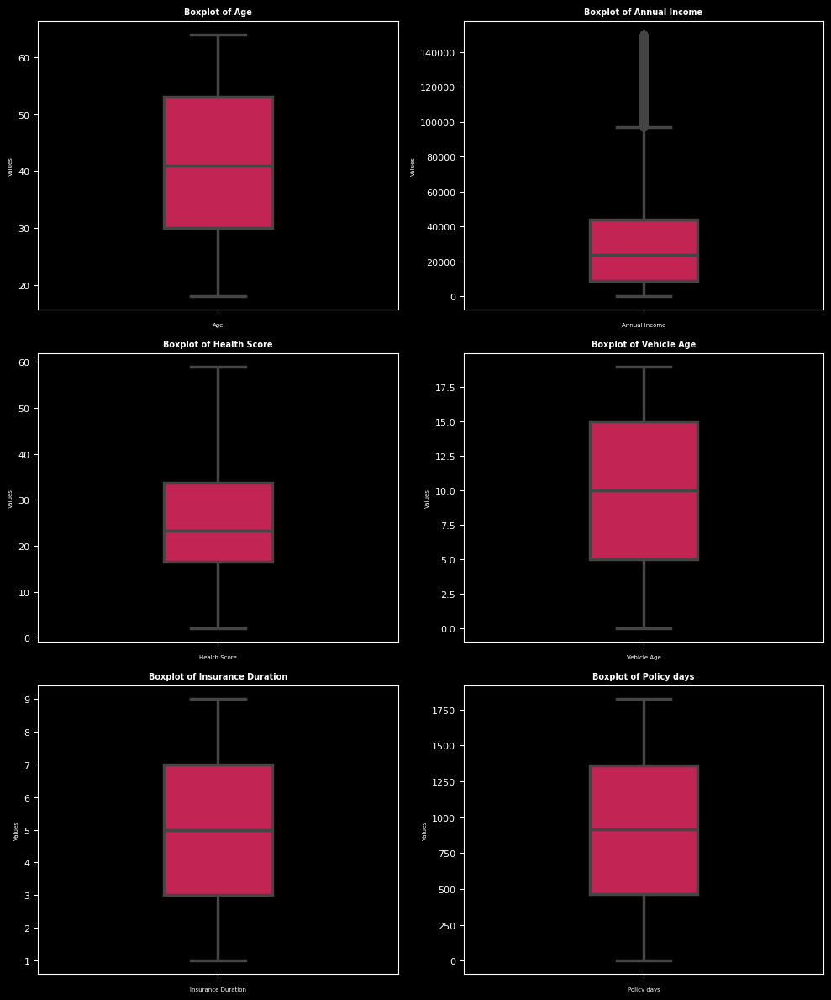

In [34]:
plot_box(train_df)

In [35]:
def plot_hist(df):
    numerical_cols =['Age','Annual Income','Health Score','Vehicle Age','Insurance Duration','Policy days']
    num_plots = len(numerical_cols)
    nrows = (num_plots+1)//2
    ncols = 2
    fig, axes = plt.subplots(figsize=(10,12),nrows=nrows,ncols=ncols,facecolor='black')
    for i,column in enumerate(numerical_cols):
        row = i//2
        col = i%2
        ax = axes[row,col]
        ax.set_facecolor('black')
        sns.histplot(x=column,data=df,palette='rocket',ax=ax,kde=True,bins=70)
        ax.set_title(f'Boxplot of {column}', color='white', fontsize=7, weight='bold')
        ax.set_xlabel(f'{column}', color='white', fontsize=5)
        ax.set_ylabel('Values', color='white', fontsize=5)
        
        ax.tick_params(axis='x', colors='white', labelsize=4)
        ax.tick_params(axis='y', colors='white', labelsize=4)
        
        for spine in ax.spines.values():
            spine.set_edgecolor('white')
        
        # Handle legend if present
        legend = ax.get_legend()
        if legend is not None:
            legend.get_frame().set_facecolor('black')
            legend.get_frame().set_edgecolor('white')
            plt.setp(legend.get_texts(), color='white')
    plt.tight_layout()
    plt.show()

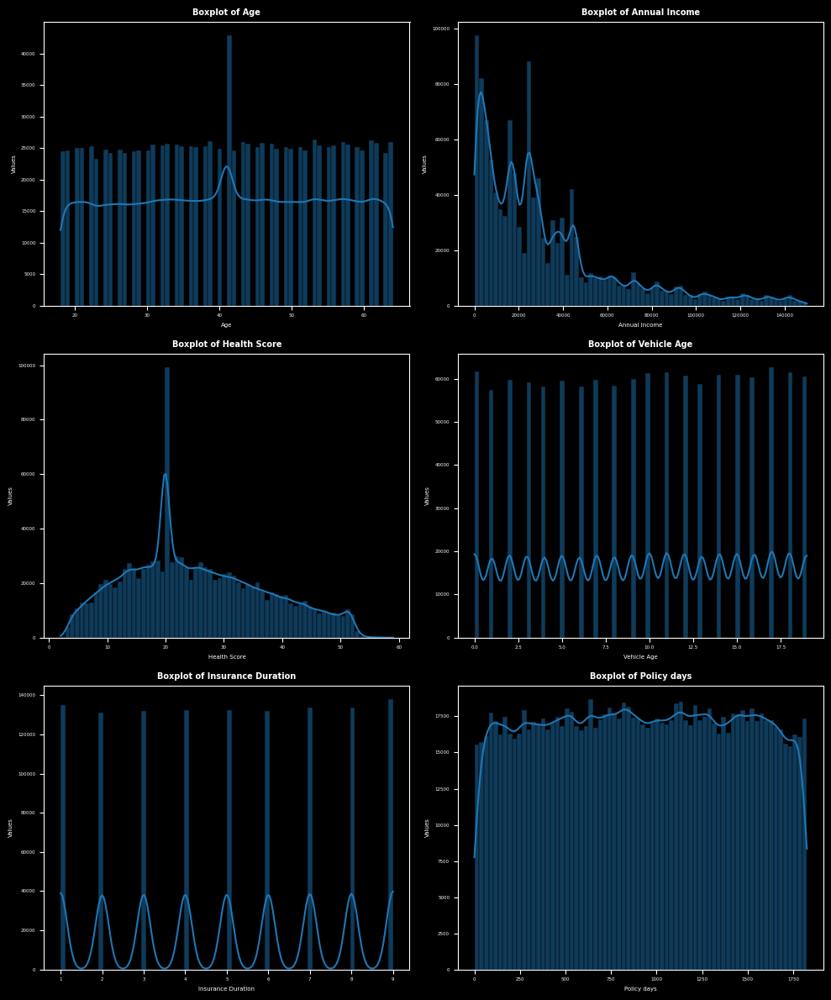

In [36]:
plot_hist(train_df)

In [37]:
def plot_count(df):
    cat_cols =  ['Number of Dependents','Gender','Marital Status','Education Level','Location','Policy Type','Customer Feedback','Smoking Status', 'Exercise Frequency', 'Property Type']
    num_plots = len(cat_cols)
    nrows = (num_plots+1)//2
    ncols = 2
    fig, axes = plt.subplots(figsize=(20,40),nrows=nrows,ncols=ncols,facecolor='black')
    for i,column in enumerate(cat_cols):
        row = i//2
        col = i%2
        ax = axes[row,col]
        ax.set_facecolor('black')
        sns.countplot(x=df[column],palette='winter',ax=ax,width=0.4,gap=0.2)
        ax.set_title(f'Distplot of {column}', color='white', fontsize=14, weight='bold')
        ax.set_xlabel(f'{column}', color='white', fontsize=12)
        ax.set_ylabel('Values', color='white', fontsize=12)
        
        ax.tick_params(axis='x', colors='white', labelsize=10)
        ax.tick_params(axis='y', colors='white', labelsize=10)
        
        for spine in ax.spines.values():
            spine.set_edgecolor('white')
        
        # Handle legend if present
        legend = ax.get_legend()
        if legend is not None:
            legend.get_frame().set_facecolor('black')
            legend.get_frame().set_edgecolor('white')
            plt.setp(legend.get_texts(), color='white')
    plt.tight_layout()
    plt.show()

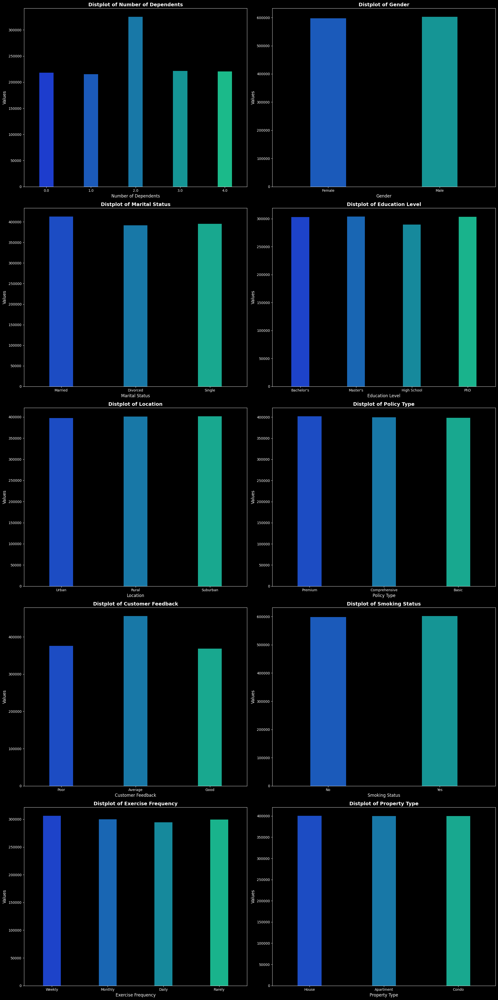

In [38]:
plot_count(train_df)

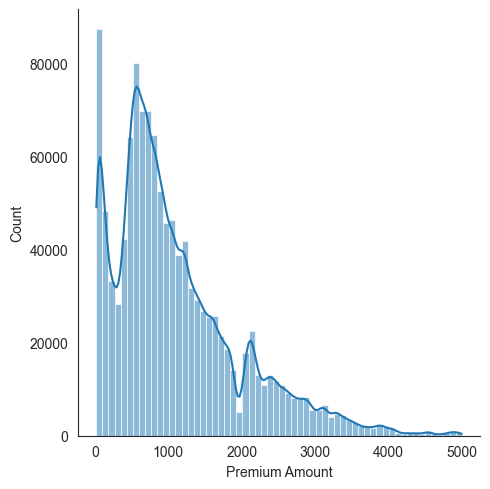

In [39]:
sns.set_style('white')
sns.displot(x='Premium Amount',data=train_df,bins=60,kde=True)
plt.show()

In [40]:
train_df.columns

Index(['Age', 'Gender', 'Annual Income', 'Marital Status',
       'Number of Dependents', 'Education Level', 'Health Score', 'Location',
       'Policy Type', 'Vehicle Age', 'Insurance Duration', 'Customer Feedback',
       'Smoking Status', 'Exercise Frequency', 'Property Type',
       'Premium Amount', 'Policy days'],
      dtype='object')

In [41]:
#one hot cols
one_hot_cols = ['Gender','Marital Status','Location','Policy Type','Smoking Status','Exercise Frequency', 'Property Type']
train_df_one_hot = pd.get_dummies(train_df[one_hot_cols],drop_first=True)
test_df_one_hot = pd.get_dummies(test_df[one_hot_cols],drop_first=True)

In [46]:
train_df = train_df.join(train_df_one_hot).drop(one_hot_cols,axis=1)
test_df = test_df.join(test_df_one_hot).drop(one_hot_cols,axis=1)

In [51]:
train_df['Education Level'] = train_df['Education Level'].replace({"High School":1,"Bachelor's":2,"Master's":3,"PhD":4})
test_df['Education Level'] = test_df['Education Level'].replace({"High School":1,"Bachelor's":2,"Master's":3,"PhD":4})

In [53]:
train_df['Customer Feedback'] = train_df['Customer Feedback'].replace({'Poor':1,'Average':2,'Good':3})
test_df['Customer Feedback'] = test_df['Customer Feedback'].replace({'Poor':1,'Average':2,'Good':3})

In [56]:
train_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1200000.0,41.143294,13.434020,18.000000,30.000000,41.00000,53.00000,64.000000
Annual Income,1200000.0,32414.310064,31615.603456,1.000000,8646.000000,23911.00000,43936.00000,149997.000000
Number of Dependents,1200000.0,2.009026,1.351022,0.000000,1.000000,2.00000,3.00000,4.000000
Education Level,1200000.0,2.517826,1.112623,1.000000,2.000000,3.00000,4.00000,4.000000
Health Score,1200000.0,25.262870,11.899764,2.012237,16.554572,23.28983,33.77289,58.975914
Vehicle Age,1200000.0,9.569886,5.776174,0.000000,5.000000,10.00000,15.00000,19.000000
Insurance Duration,1200000.0,5.018219,2.594330,1.000000,3.000000,5.00000,7.00000,9.000000
Customer Feedback,1200000.0,1.994363,0.787524,1.000000,1.000000,2.00000,3.00000,3.000000
Premium Amount,1200000.0,1102.544822,864.998859,20.000000,514.000000,872.00000,1509.00000,4999.000000
Policy days,1200000.0,914.413353,521.439744,0.000000,467.000000,913.00000,1364.00000,1825.000000


In [57]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1200000 entries, 0 to 1199999
Data columns (total 23 columns):
 #   Column                      Non-Null Count    Dtype  
---  ------                      --------------    -----  
 0   Age                         1200000 non-null  float64
 1   Annual Income               1200000 non-null  float64
 2   Number of Dependents        1200000 non-null  float64
 3   Education Level             1200000 non-null  int64  
 4   Health Score                1200000 non-null  float64
 5   Vehicle Age                 1200000 non-null  float64
 6   Insurance Duration          1200000 non-null  float64
 7   Customer Feedback           1200000 non-null  int64  
 8   Premium Amount              1200000 non-null  float64
 9   Policy days                 1200000 non-null  int64  
 10  Gender_Male                 1200000 non-null  bool   
 11  Marital Status_Married      1200000 non-null  bool   
 12  Marital Status_Single       1200000 non-null  bool   
 13  Lo

In [58]:
train_df['Age'] = train_df['Age'].astype('int8')
test_df['Age'] = test_df['Age'].astype('int8')
train_df['Annual Income'] = train_df['Annual Income'].astype('float32')
test_df['Annual Income'] = test_df['Annual Income'].astype('float32')
train_df['Number of Dependents'] = train_df['Number of Dependents'].astype('int8')
test_df['Number of Dependents'] = test_df['Number of Dependents'].astype('int8')
train_df['Education Level'] = train_df['Education Level'].astype('int8')
test_df['Education Level'] = test_df['Education Level'].astype('int8')
train_df['Health Score'] = train_df['Health Score'].astype('float16')
test_df['Health Score'] = test_df['Health Score'].astype('float16')
train_df['Vehicle Age'] = train_df['Vehicle Age'].astype('int8')
test_df['Vehicle Age'] = test_df['Vehicle Age'].astype('int8')
train_df['Insurance Duration'] = train_df['Insurance Duration'].astype('int8')
test_df['Insurance Duration'] = test_df['Insurance Duration'].astype('int8')
train_df['Customer Feedback'] = train_df['Customer Feedback'].astype('int8')
test_df['Customer Feedback'] = test_df['Customer Feedback'].astype('int8')
train_df['Premium Amount'] = train_df['Premium Amount'].astype('float16')

In [59]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1200000 entries, 0 to 1199999
Data columns (total 23 columns):
 #   Column                      Non-Null Count    Dtype  
---  ------                      --------------    -----  
 0   Age                         1200000 non-null  int8   
 1   Annual Income               1200000 non-null  float32
 2   Number of Dependents        1200000 non-null  int8   
 3   Education Level             1200000 non-null  int8   
 4   Health Score                1200000 non-null  float16
 5   Vehicle Age                 1200000 non-null  int8   
 6   Insurance Duration          1200000 non-null  int8   
 7   Customer Feedback           1200000 non-null  int8   
 8   Premium Amount              1200000 non-null  float16
 9   Policy days                 1200000 non-null  int64  
 10  Gender_Male                 1200000 non-null  bool   
 11  Marital Status_Married      1200000 non-null  bool   
 12  Marital Status_Single       1200000 non-null  bool   
 13  Lo

In [70]:
train_df['Annual Income'].fillna(0,inplace=True)
train_df['Health Score'].fillna(0,inplace=True)

In [71]:
test_df['Annual Income'].fillna(0,inplace=True)
test_df['Health Score'].fillna(0,inplace=True)

In [72]:
X_train = train_df.drop('Premium Amount',axis=1)
y_train = train_df['Premium Amount']
X_test = test_df

In [73]:
X_train,X_val,y_train,y_val = train_test_split(X_train,y_train,test_size=0.15)

In [74]:
st_sclr = StandardScaler()
X_train = st_sclr.fit_transform(X_train)
X_test = st_sclr.transform(X_test)
X_val = st_sclr.transform(X_val)

In [92]:
import time
def train_model(model,name):
    start = time.time()
    model.fit(X_train,y_train)
    pred_model = model.predict(X_val)
    print(f"Total time : {time.time() - start}")
    print(name)
    print(f"MAE : {mean_absolute_error(y_val,pred_model)}","\n")
    print(f"MSE : {np.sqrt(mean_squared_error(y_val,pred_model))}","\n")
    print(f"R2 : {r2_score(y_val,pred_model)}","\n")
    print(f"Root Mean Squared Log Error : {np.sqrt(mean_squared_log_error(y_val,pred_model))}")

In [93]:
from sklearn.tree import DecisionTreeRegressor
dtree = DecisionTreeRegressor()
train_model(dtree,"DecisionTree")

Total time : 10.20855188369751
DecisionTree
MAE : 937.9897555555556 

MSE : 1259.1395132214523 

R2 : -1.1223764434641974 

Root Mean Squared Log Error : 1.5598473897236889


In [94]:
from sklearn.ensemble import RandomForestRegressor
rfc = RandomForestRegressor()
train_model(rfc,"RFC")

Total time : 692.6475200653076
RFC
MAE : 682.5443454444445 

MSE : 869.741600921832 

R2 : -0.012640279144770172 

Root Mean Squared Log Error : 1.1856739706197434


In [95]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
train_model(lr,"LR")

Total time : 0.33480119705200195
LR
MAE : 668.463339926912 

MSE : 864.1537882848722 

R2 : 0.0003297047958508159 

Root Mean Squared Log Error : 1.1691512149349135


In [96]:
from sklearn.linear_model import ElasticNetCV
enet = ElasticNetCV()
train_model(enet,"ElasticNet")

Total time : 2.896812677383423
ElasticNet
MAE : 668.4659001813051 

MSE : 864.1502702722663 

R2 : 0.00033784419323412695 

Root Mean Squared Log Error : 1.1692120737582217


In [97]:
from sklearn.linear_model import LassoLarsCV
lasso = LassoLarsCV()
train_model(lasso,"LassoLars")

Total time : 1.6423618793487549
LassoLars
MAE : 668.4599784996259 

MSE : 864.1401875339803 

R2 : 0.0003611717866780495 

Root Mean Squared Log Error : 1.1692114511029106


In [98]:
from sklearn.linear_model import RidgeCV
ridge = RidgeCV()
train_model(ridge,"RidgeCV")

Total time : 0.571038007736206
RidgeCV
MAE : 668.4633402900463 

MSE : 864.1537879493798 

R2 : 0.0003297055720593578 

Root Mean Squared Log Error : 1.1691512223125613


In [99]:
def pred_to_csv(prediction,model_name):
    new_test_df = pd.read_csv("test.csv")
    pred_df = pd.DataFrame(prediction,columns=['Premium Amount'])
    pred_df = pd.concat([pred_df,new_test_df['id']],axis=1)
    pred_df.set_index("id",inplace=True)
    pred_df.to_csv("ps_s4_e12_"+str(model_name)+".csv")

In [101]:
ridge_pred = ridge.predict(X_test)
pred_to_csv(ridge_pred,'ridge')

In [104]:
from xgboost import XGBRegressor
xgb = XGBRegressor()
train_model(xgb,"XGB")

Total time : 1.339040994644165
XGB
MAE : 663.26904296875 

MSE : 859.519775390625 

R2 : 0.01102226972579956 

Root Mean Squared Log Error : 1.1642125844955444


In [112]:
from lightgbm import LGBMRegressor
params = {
    'learning_rate': 0.01,          # Increase learning rate to a more typical value
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': 'rmsle',
    'sub_feature': 0.7,             # Feature fraction for better generalization
    'num_leaves': 700,               # Further reduce the number of leaves
    'min_child_samples': 13,        # Increase min child samples for better generalization
    'n_estimators': 5000,            # Reduce number of estimators
    'max_depth': 1000,                # Set max depth to a reasonable value
    'bagging_fraction': 0.75,       # Reduce bagging fraction to introduce more randomness
    'bagging_freq': 5,              # Bagging every 5 iterations
    'lambda_l1': 0.05,               # Add L1 regularization
    'lambda_l2': 0.05                # Add L2 regularization
}
lgbm = LGBMRegressor(**params)
train_model(lgbm,"LGBM")

[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.7. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] bagging_fraction is set=0.75, subsample=1.0 will be ignored. Current value: bagging_fraction=0.75
[LightGBM] [Warning] lambda_l2 is set=0.05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05
[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.7. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] bagging_fraction is set=0.75, subs

In [111]:
lgbm_pred = lgbm.predict(X_test)
pred_to_csv(lgbm_pred,"LGBM")

[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.7. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] bagging_fraction is set=0.75, subsample=1.0 will be ignored. Current value: bagging_fraction=0.75
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1


In [115]:
from catboost import CatBoostRegressor
cat_model = CatBoostRegressor()
train_model(cat_model,"CATREG",)

Learning rate set to 0.122332
0:	learn: 864.6067318	total: 18ms	remaining: 17.9s
1:	learn: 864.2388511	total: 31.7ms	remaining: 15.8s
2:	learn: 863.6836862	total: 45.3ms	remaining: 15s
3:	learn: 863.3916513	total: 58.5ms	remaining: 14.6s
4:	learn: 863.1805380	total: 71.7ms	remaining: 14.3s
5:	learn: 863.0074014	total: 84.7ms	remaining: 14s
6:	learn: 862.7987811	total: 100ms	remaining: 14.2s
7:	learn: 862.6727537	total: 113ms	remaining: 14s
8:	learn: 862.5794415	total: 126ms	remaining: 13.9s
9:	learn: 862.3591530	total: 140ms	remaining: 13.9s
10:	learn: 862.2796289	total: 154ms	remaining: 13.9s
11:	learn: 862.1970397	total: 168ms	remaining: 13.8s
12:	learn: 862.0531172	total: 184ms	remaining: 13.9s
13:	learn: 861.9938837	total: 198ms	remaining: 13.9s
14:	learn: 861.9483943	total: 213ms	remaining: 14s
15:	learn: 861.8204864	total: 228ms	remaining: 14.1s
16:	learn: 861.7027133	total: 244ms	remaining: 14.1s
17:	learn: 861.6046710	total: 260ms	remaining: 14.2s
18:	learn: 861.5751375	total: 

161:	learn: 859.4003585	total: 2.68s	remaining: 13.9s
162:	learn: 859.3930486	total: 2.7s	remaining: 13.9s
163:	learn: 859.3814586	total: 2.71s	remaining: 13.8s
164:	learn: 859.3697418	total: 2.73s	remaining: 13.8s
165:	learn: 859.3621726	total: 2.74s	remaining: 13.8s
166:	learn: 859.3525666	total: 2.75s	remaining: 13.7s
167:	learn: 859.3419360	total: 2.77s	remaining: 13.7s
168:	learn: 859.3345096	total: 2.78s	remaining: 13.7s
169:	learn: 859.3256095	total: 2.8s	remaining: 13.7s
170:	learn: 859.3162116	total: 2.81s	remaining: 13.6s
171:	learn: 859.3062132	total: 2.83s	remaining: 13.6s
172:	learn: 859.2982650	total: 2.85s	remaining: 13.6s
173:	learn: 859.2883935	total: 2.86s	remaining: 13.6s
174:	learn: 859.2804034	total: 2.88s	remaining: 13.6s
175:	learn: 859.2671484	total: 2.89s	remaining: 13.6s
176:	learn: 859.2567666	total: 2.91s	remaining: 13.5s
177:	learn: 859.2490138	total: 2.93s	remaining: 13.5s
178:	learn: 859.2379857	total: 2.95s	remaining: 13.6s
179:	learn: 859.2271026	total:

314:	learn: 858.0596564	total: 5.42s	remaining: 11.8s
315:	learn: 858.0517307	total: 5.44s	remaining: 11.8s
316:	learn: 858.0456434	total: 5.46s	remaining: 11.8s
317:	learn: 858.0333839	total: 5.48s	remaining: 11.8s
318:	learn: 858.0264230	total: 5.5s	remaining: 11.7s
319:	learn: 858.0182164	total: 5.52s	remaining: 11.7s
320:	learn: 858.0102967	total: 5.54s	remaining: 11.7s
321:	learn: 858.0044296	total: 5.55s	remaining: 11.7s
322:	learn: 857.9927564	total: 5.57s	remaining: 11.7s
323:	learn: 857.9871199	total: 5.59s	remaining: 11.7s
324:	learn: 857.9811793	total: 5.61s	remaining: 11.7s
325:	learn: 857.9724145	total: 5.63s	remaining: 11.6s
326:	learn: 857.9643331	total: 5.65s	remaining: 11.6s
327:	learn: 857.9568414	total: 5.66s	remaining: 11.6s
328:	learn: 857.9474578	total: 5.68s	remaining: 11.6s
329:	learn: 857.9396892	total: 5.7s	remaining: 11.6s
330:	learn: 857.9307202	total: 5.72s	remaining: 11.6s
331:	learn: 857.9217248	total: 5.74s	remaining: 11.6s
332:	learn: 857.9127536	total:

477:	learn: 856.7703612	total: 8.14s	remaining: 8.89s
478:	learn: 856.7613191	total: 8.16s	remaining: 8.87s
479:	learn: 856.7510921	total: 8.18s	remaining: 8.86s
480:	learn: 856.7412384	total: 8.19s	remaining: 8.84s
481:	learn: 856.7339936	total: 8.2s	remaining: 8.82s
482:	learn: 856.7259993	total: 8.22s	remaining: 8.8s
483:	learn: 856.7187775	total: 8.23s	remaining: 8.78s
484:	learn: 856.7120948	total: 8.25s	remaining: 8.76s
485:	learn: 856.7064369	total: 8.26s	remaining: 8.74s
486:	learn: 856.6972306	total: 8.27s	remaining: 8.71s
487:	learn: 856.6921729	total: 8.29s	remaining: 8.7s
488:	learn: 856.6835412	total: 8.3s	remaining: 8.68s
489:	learn: 856.6769786	total: 8.32s	remaining: 8.66s
490:	learn: 856.6710059	total: 8.33s	remaining: 8.64s
491:	learn: 856.6632892	total: 8.35s	remaining: 8.62s
492:	learn: 856.6552396	total: 8.36s	remaining: 8.6s
493:	learn: 856.6504790	total: 8.38s	remaining: 8.58s
494:	learn: 856.6462312	total: 8.39s	remaining: 8.56s
495:	learn: 856.6393635	total: 8.

631:	learn: 855.6566430	total: 10.4s	remaining: 6.07s
632:	learn: 855.6492670	total: 10.4s	remaining: 6.05s
633:	learn: 855.6421216	total: 10.4s	remaining: 6.03s
634:	learn: 855.6354733	total: 10.5s	remaining: 6.01s
635:	learn: 855.6315261	total: 10.5s	remaining: 6s
636:	learn: 855.6230419	total: 10.5s	remaining: 5.98s
637:	learn: 855.6159248	total: 10.5s	remaining: 5.96s
638:	learn: 855.6084674	total: 10.5s	remaining: 5.94s
639:	learn: 855.6023343	total: 10.5s	remaining: 5.93s
640:	learn: 855.5944420	total: 10.6s	remaining: 5.91s
641:	learn: 855.5837691	total: 10.6s	remaining: 5.89s
642:	learn: 855.5761395	total: 10.6s	remaining: 5.88s
643:	learn: 855.5676755	total: 10.6s	remaining: 5.86s
644:	learn: 855.5604082	total: 10.6s	remaining: 5.84s
645:	learn: 855.5543174	total: 10.6s	remaining: 5.82s
646:	learn: 855.5490155	total: 10.6s	remaining: 5.8s
647:	learn: 855.5410479	total: 10.7s	remaining: 5.79s
648:	learn: 855.5339066	total: 10.7s	remaining: 5.77s
649:	learn: 855.5287475	total: 1

793:	learn: 854.5203572	total: 12.7s	remaining: 3.3s
794:	learn: 854.5153373	total: 12.7s	remaining: 3.28s
795:	learn: 854.5079034	total: 12.7s	remaining: 3.27s
796:	learn: 854.4980747	total: 12.8s	remaining: 3.25s
797:	learn: 854.4914830	total: 12.8s	remaining: 3.23s
798:	learn: 854.4838487	total: 12.8s	remaining: 3.22s
799:	learn: 854.4782810	total: 12.8s	remaining: 3.2s
800:	learn: 854.4697895	total: 12.8s	remaining: 3.18s
801:	learn: 854.4629367	total: 12.8s	remaining: 3.17s
802:	learn: 854.4563826	total: 12.8s	remaining: 3.15s
803:	learn: 854.4484119	total: 12.9s	remaining: 3.13s
804:	learn: 854.4403983	total: 12.9s	remaining: 3.12s
805:	learn: 854.4317623	total: 12.9s	remaining: 3.1s
806:	learn: 854.4244138	total: 12.9s	remaining: 3.09s
807:	learn: 854.4199086	total: 12.9s	remaining: 3.07s
808:	learn: 854.4143146	total: 12.9s	remaining: 3.05s
809:	learn: 854.4077707	total: 12.9s	remaining: 3.04s
810:	learn: 854.4004770	total: 13s	remaining: 3.02s
811:	learn: 854.3945004	total: 13

954:	learn: 853.4073128	total: 15s	remaining: 707ms
955:	learn: 853.3990012	total: 15s	remaining: 691ms
956:	learn: 853.3924934	total: 15s	remaining: 676ms
957:	learn: 853.3851019	total: 15.1s	remaining: 660ms
958:	learn: 853.3787593	total: 15.1s	remaining: 644ms
959:	learn: 853.3718635	total: 15.1s	remaining: 628ms
960:	learn: 853.3666802	total: 15.1s	remaining: 612ms
961:	learn: 853.3602647	total: 15.1s	remaining: 597ms
962:	learn: 853.3534831	total: 15.1s	remaining: 581ms
963:	learn: 853.3451643	total: 15.1s	remaining: 565ms
964:	learn: 853.3378694	total: 15.1s	remaining: 549ms
965:	learn: 853.3323446	total: 15.2s	remaining: 534ms
966:	learn: 853.3239395	total: 15.2s	remaining: 518ms
967:	learn: 853.3166358	total: 15.2s	remaining: 502ms
968:	learn: 853.3106763	total: 15.2s	remaining: 486ms
969:	learn: 853.3034060	total: 15.2s	remaining: 471ms
970:	learn: 853.2967609	total: 15.2s	remaining: 455ms
971:	learn: 853.2887454	total: 15.2s	remaining: 439ms
972:	learn: 853.2825494	total: 15.

In [116]:
from sklearn.ensemble import StackingRegressor
meta = LinearRegression()
reg_models = [("rfc",RandomForestRegressor()),
             ("cat",CatBoostRegressor()),
             ("lgbm",LGBMRegressor()),
             ('xgb',XGBRegressor())]
stack = StackingRegressor(estimators=reg_models,final_estimator=meta)

In [117]:
stack.fit(X_train,y_train)

Learning rate set to 0.122332
0:	learn: 864.6067318	total: 23.5ms	remaining: 23.5s
1:	learn: 864.2388511	total: 37.8ms	remaining: 18.9s
2:	learn: 863.6836862	total: 52.3ms	remaining: 17.4s
3:	learn: 863.3916513	total: 65.9ms	remaining: 16.4s
4:	learn: 863.1805380	total: 79.1ms	remaining: 15.7s
5:	learn: 863.0074014	total: 93.4ms	remaining: 15.5s
6:	learn: 862.7987811	total: 109ms	remaining: 15.5s
7:	learn: 862.6727537	total: 123ms	remaining: 15.2s
8:	learn: 862.5794415	total: 136ms	remaining: 15s
9:	learn: 862.3591530	total: 151ms	remaining: 14.9s
10:	learn: 862.2796289	total: 165ms	remaining: 14.8s
11:	learn: 862.1970397	total: 180ms	remaining: 14.8s
12:	learn: 862.0531172	total: 194ms	remaining: 14.8s
13:	learn: 861.9938837	total: 208ms	remaining: 14.6s
14:	learn: 861.9483943	total: 221ms	remaining: 14.5s
15:	learn: 861.8204864	total: 236ms	remaining: 14.5s
16:	learn: 861.7027133	total: 250ms	remaining: 14.5s
17:	learn: 861.6046710	total: 265ms	remaining: 14.5s
18:	learn: 861.5751375

155:	learn: 859.4621655	total: 2.23s	remaining: 12s
156:	learn: 859.4544848	total: 2.24s	remaining: 12s
157:	learn: 859.4464304	total: 2.25s	remaining: 12s
158:	learn: 859.4386883	total: 2.27s	remaining: 12s
159:	learn: 859.4226736	total: 2.28s	remaining: 12s
160:	learn: 859.4141788	total: 2.3s	remaining: 12s
161:	learn: 859.4003585	total: 2.31s	remaining: 12s
162:	learn: 859.3930486	total: 2.33s	remaining: 11.9s
163:	learn: 859.3814586	total: 2.34s	remaining: 11.9s
164:	learn: 859.3697418	total: 2.35s	remaining: 11.9s
165:	learn: 859.3621726	total: 2.37s	remaining: 11.9s
166:	learn: 859.3525666	total: 2.38s	remaining: 11.9s
167:	learn: 859.3419360	total: 2.39s	remaining: 11.9s
168:	learn: 859.3345096	total: 2.41s	remaining: 11.8s
169:	learn: 859.3256095	total: 2.42s	remaining: 11.8s
170:	learn: 859.3162116	total: 2.44s	remaining: 11.8s
171:	learn: 859.3062132	total: 2.45s	remaining: 11.8s
172:	learn: 859.2982650	total: 2.46s	remaining: 11.8s
173:	learn: 859.2883935	total: 2.48s	remain

316:	learn: 858.0456434	total: 4.51s	remaining: 9.71s
317:	learn: 858.0333839	total: 4.52s	remaining: 9.7s
318:	learn: 858.0264230	total: 4.54s	remaining: 9.68s
319:	learn: 858.0182164	total: 4.55s	remaining: 9.67s
320:	learn: 858.0102967	total: 4.56s	remaining: 9.65s
321:	learn: 858.0044296	total: 4.58s	remaining: 9.63s
322:	learn: 857.9927564	total: 4.59s	remaining: 9.62s
323:	learn: 857.9871199	total: 4.6s	remaining: 9.61s
324:	learn: 857.9811793	total: 4.62s	remaining: 9.59s
325:	learn: 857.9724145	total: 4.63s	remaining: 9.58s
326:	learn: 857.9643331	total: 4.65s	remaining: 9.56s
327:	learn: 857.9568414	total: 4.66s	remaining: 9.54s
328:	learn: 857.9474578	total: 4.67s	remaining: 9.53s
329:	learn: 857.9396892	total: 4.69s	remaining: 9.52s
330:	learn: 857.9307202	total: 4.7s	remaining: 9.5s
331:	learn: 857.9217248	total: 4.71s	remaining: 9.49s
332:	learn: 857.9127536	total: 4.73s	remaining: 9.47s
333:	learn: 857.9036303	total: 4.74s	remaining: 9.46s
334:	learn: 857.8934911	total: 4

474:	learn: 856.7931765	total: 6.77s	remaining: 7.48s
475:	learn: 856.7868109	total: 6.79s	remaining: 7.47s
476:	learn: 856.7802733	total: 6.8s	remaining: 7.46s
477:	learn: 856.7703612	total: 6.81s	remaining: 7.44s
478:	learn: 856.7613191	total: 6.83s	remaining: 7.43s
479:	learn: 856.7510921	total: 6.84s	remaining: 7.41s
480:	learn: 856.7412384	total: 6.86s	remaining: 7.4s
481:	learn: 856.7339936	total: 6.87s	remaining: 7.38s
482:	learn: 856.7259993	total: 6.88s	remaining: 7.37s
483:	learn: 856.7187775	total: 6.9s	remaining: 7.35s
484:	learn: 856.7120948	total: 6.91s	remaining: 7.34s
485:	learn: 856.7064369	total: 6.92s	remaining: 7.32s
486:	learn: 856.6972306	total: 6.94s	remaining: 7.31s
487:	learn: 856.6921729	total: 6.95s	remaining: 7.29s
488:	learn: 856.6835412	total: 6.97s	remaining: 7.28s
489:	learn: 856.6769786	total: 6.98s	remaining: 7.26s
490:	learn: 856.6710059	total: 6.99s	remaining: 7.25s
491:	learn: 856.6632892	total: 7.01s	remaining: 7.24s
492:	learn: 856.6552396	total: 

639:	learn: 855.6023343	total: 9.03s	remaining: 5.08s
640:	learn: 855.5944420	total: 9.04s	remaining: 5.06s
641:	learn: 855.5837691	total: 9.06s	remaining: 5.05s
642:	learn: 855.5761395	total: 9.07s	remaining: 5.04s
643:	learn: 855.5676755	total: 9.09s	remaining: 5.02s
644:	learn: 855.5604082	total: 9.1s	remaining: 5.01s
645:	learn: 855.5543174	total: 9.11s	remaining: 4.99s
646:	learn: 855.5490155	total: 9.13s	remaining: 4.98s
647:	learn: 855.5410479	total: 9.14s	remaining: 4.96s
648:	learn: 855.5339066	total: 9.15s	remaining: 4.95s
649:	learn: 855.5287475	total: 9.17s	remaining: 4.93s
650:	learn: 855.5216547	total: 9.18s	remaining: 4.92s
651:	learn: 855.5131299	total: 9.19s	remaining: 4.91s
652:	learn: 855.5068600	total: 9.21s	remaining: 4.89s
653:	learn: 855.4989342	total: 9.22s	remaining: 4.88s
654:	learn: 855.4918924	total: 9.24s	remaining: 4.87s
655:	learn: 855.4827318	total: 9.25s	remaining: 4.85s
656:	learn: 855.4768891	total: 9.26s	remaining: 4.84s
657:	learn: 855.4677663	total

803:	learn: 854.4484119	total: 11.3s	remaining: 2.75s
804:	learn: 854.4403983	total: 11.3s	remaining: 2.74s
805:	learn: 854.4317623	total: 11.3s	remaining: 2.73s
806:	learn: 854.4244138	total: 11.3s	remaining: 2.71s
807:	learn: 854.4199086	total: 11.4s	remaining: 2.7s
808:	learn: 854.4143146	total: 11.4s	remaining: 2.68s
809:	learn: 854.4077707	total: 11.4s	remaining: 2.67s
810:	learn: 854.4004770	total: 11.4s	remaining: 2.65s
811:	learn: 854.3945004	total: 11.4s	remaining: 2.64s
812:	learn: 854.3850736	total: 11.4s	remaining: 2.63s
813:	learn: 854.3769352	total: 11.4s	remaining: 2.61s
814:	learn: 854.3717552	total: 11.5s	remaining: 2.6s
815:	learn: 854.3667290	total: 11.5s	remaining: 2.58s
816:	learn: 854.3599182	total: 11.5s	remaining: 2.57s
817:	learn: 854.3533964	total: 11.5s	remaining: 2.56s
818:	learn: 854.3459518	total: 11.5s	remaining: 2.54s
819:	learn: 854.3394074	total: 11.5s	remaining: 2.53s
820:	learn: 854.3311195	total: 11.5s	remaining: 2.51s
821:	learn: 854.3250278	total:

966:	learn: 853.3239395	total: 13.6s	remaining: 464ms
967:	learn: 853.3166358	total: 13.6s	remaining: 450ms
968:	learn: 853.3106763	total: 13.6s	remaining: 436ms
969:	learn: 853.3034060	total: 13.6s	remaining: 422ms
970:	learn: 853.2967609	total: 13.6s	remaining: 407ms
971:	learn: 853.2887454	total: 13.7s	remaining: 393ms
972:	learn: 853.2825494	total: 13.7s	remaining: 379ms
973:	learn: 853.2762255	total: 13.7s	remaining: 365ms
974:	learn: 853.2705604	total: 13.7s	remaining: 351ms
975:	learn: 853.2646624	total: 13.7s	remaining: 337ms
976:	learn: 853.2572276	total: 13.7s	remaining: 323ms
977:	learn: 853.2506180	total: 13.7s	remaining: 309ms
978:	learn: 853.2466636	total: 13.8s	remaining: 295ms
979:	learn: 853.2392049	total: 13.8s	remaining: 281ms
980:	learn: 853.2335774	total: 13.8s	remaining: 267ms
981:	learn: 853.2272370	total: 13.8s	remaining: 253ms
982:	learn: 853.2216857	total: 13.8s	remaining: 239ms
983:	learn: 853.2150388	total: 13.8s	remaining: 225ms
984:	learn: 853.2071524	tota

117:	learn: 860.5869246	total: 1.4s	remaining: 10.5s
118:	learn: 860.5779385	total: 1.41s	remaining: 10.4s
119:	learn: 860.5708209	total: 1.42s	remaining: 10.4s
120:	learn: 860.5616503	total: 1.43s	remaining: 10.4s
121:	learn: 860.5468642	total: 1.45s	remaining: 10.4s
122:	learn: 860.5345897	total: 1.46s	remaining: 10.4s
123:	learn: 860.5253706	total: 1.47s	remaining: 10.4s
124:	learn: 860.5142994	total: 1.48s	remaining: 10.4s
125:	learn: 860.5036637	total: 1.49s	remaining: 10.3s
126:	learn: 860.4901858	total: 1.5s	remaining: 10.3s
127:	learn: 860.4788805	total: 1.51s	remaining: 10.3s
128:	learn: 860.4705768	total: 1.52s	remaining: 10.3s
129:	learn: 860.4589278	total: 1.54s	remaining: 10.3s
130:	learn: 860.4444147	total: 1.55s	remaining: 10.3s
131:	learn: 860.4292608	total: 1.56s	remaining: 10.3s
132:	learn: 860.4157272	total: 1.57s	remaining: 10.2s
133:	learn: 860.4064472	total: 1.58s	remaining: 10.2s
134:	learn: 860.3957340	total: 1.59s	remaining: 10.2s
135:	learn: 860.3875820	total:

278:	learn: 858.8349928	total: 3.27s	remaining: 8.44s
279:	learn: 858.8256683	total: 3.28s	remaining: 8.43s
280:	learn: 858.8124036	total: 3.29s	remaining: 8.42s
281:	learn: 858.8023876	total: 3.3s	remaining: 8.4s
282:	learn: 858.7906721	total: 3.31s	remaining: 8.39s
283:	learn: 858.7842711	total: 3.32s	remaining: 8.38s
284:	learn: 858.7724447	total: 3.33s	remaining: 8.37s
285:	learn: 858.7640365	total: 3.35s	remaining: 8.36s
286:	learn: 858.7543293	total: 3.36s	remaining: 8.35s
287:	learn: 858.7412431	total: 3.37s	remaining: 8.33s
288:	learn: 858.7296417	total: 3.38s	remaining: 8.32s
289:	learn: 858.7213846	total: 3.4s	remaining: 8.31s
290:	learn: 858.7094045	total: 3.41s	remaining: 8.3s
291:	learn: 858.6962146	total: 3.42s	remaining: 8.29s
292:	learn: 858.6887300	total: 3.43s	remaining: 8.28s
293:	learn: 858.6747518	total: 3.44s	remaining: 8.27s
294:	learn: 858.6661196	total: 3.46s	remaining: 8.26s
295:	learn: 858.6565594	total: 3.47s	remaining: 8.25s
296:	learn: 858.6471534	total: 3

438:	learn: 857.3089137	total: 5.11s	remaining: 6.53s
439:	learn: 857.2980356	total: 5.12s	remaining: 6.52s
440:	learn: 857.2909802	total: 5.13s	remaining: 6.5s
441:	learn: 857.2784465	total: 5.14s	remaining: 6.49s
442:	learn: 857.2708879	total: 5.15s	remaining: 6.48s
443:	learn: 857.2616155	total: 5.17s	remaining: 6.47s
444:	learn: 857.2513058	total: 5.18s	remaining: 6.46s
445:	learn: 857.2420904	total: 5.19s	remaining: 6.44s
446:	learn: 857.2325442	total: 5.2s	remaining: 6.43s
447:	learn: 857.2225367	total: 5.21s	remaining: 6.42s
448:	learn: 857.2126032	total: 5.22s	remaining: 6.41s
449:	learn: 857.2053920	total: 5.23s	remaining: 6.4s
450:	learn: 857.1911291	total: 5.25s	remaining: 6.38s
451:	learn: 857.1838937	total: 5.26s	remaining: 6.37s
452:	learn: 857.1721333	total: 5.27s	remaining: 6.36s
453:	learn: 857.1626808	total: 5.28s	remaining: 6.35s
454:	learn: 857.1546975	total: 5.29s	remaining: 6.34s
455:	learn: 857.1440526	total: 5.3s	remaining: 6.33s
456:	learn: 857.1356683	total: 5

600:	learn: 855.8627197	total: 6.98s	remaining: 4.63s
601:	learn: 855.8529819	total: 6.99s	remaining: 4.62s
602:	learn: 855.8407699	total: 7s	remaining: 4.61s
603:	learn: 855.8312920	total: 7.01s	remaining: 4.6s
604:	learn: 855.8242849	total: 7.03s	remaining: 4.59s
605:	learn: 855.8161279	total: 7.04s	remaining: 4.58s
606:	learn: 855.8062095	total: 7.05s	remaining: 4.56s
607:	learn: 855.7976800	total: 7.06s	remaining: 4.55s
608:	learn: 855.7868224	total: 7.07s	remaining: 4.54s
609:	learn: 855.7772053	total: 7.08s	remaining: 4.53s
610:	learn: 855.7652662	total: 7.1s	remaining: 4.52s
611:	learn: 855.7570533	total: 7.11s	remaining: 4.51s
612:	learn: 855.7467749	total: 7.12s	remaining: 4.5s
613:	learn: 855.7380865	total: 7.13s	remaining: 4.48s
614:	learn: 855.7306602	total: 7.14s	remaining: 4.47s
615:	learn: 855.7234044	total: 7.16s	remaining: 4.46s
616:	learn: 855.7147791	total: 7.17s	remaining: 4.45s
617:	learn: 855.7068583	total: 7.18s	remaining: 4.44s
618:	learn: 855.6976997	total: 7.1

759:	learn: 854.5265462	total: 8.82s	remaining: 2.78s
760:	learn: 854.5157758	total: 8.83s	remaining: 2.77s
761:	learn: 854.5061858	total: 8.84s	remaining: 2.76s
762:	learn: 854.5003234	total: 8.85s	remaining: 2.75s
763:	learn: 854.4922342	total: 8.87s	remaining: 2.74s
764:	learn: 854.4803564	total: 8.88s	remaining: 2.73s
765:	learn: 854.4738506	total: 8.89s	remaining: 2.71s
766:	learn: 854.4640617	total: 8.9s	remaining: 2.7s
767:	learn: 854.4560381	total: 8.91s	remaining: 2.69s
768:	learn: 854.4475714	total: 8.92s	remaining: 2.68s
769:	learn: 854.4394702	total: 8.93s	remaining: 2.67s
770:	learn: 854.4332460	total: 8.95s	remaining: 2.66s
771:	learn: 854.4216690	total: 8.96s	remaining: 2.65s
772:	learn: 854.4143131	total: 8.97s	remaining: 2.63s
773:	learn: 854.4073562	total: 8.98s	remaining: 2.62s
774:	learn: 854.3974528	total: 8.99s	remaining: 2.61s
775:	learn: 854.3878523	total: 9s	remaining: 2.6s
776:	learn: 854.3817448	total: 9.01s	remaining: 2.59s
777:	learn: 854.3743771	total: 9.0

920:	learn: 853.2204133	total: 10.7s	remaining: 917ms
921:	learn: 853.2111460	total: 10.7s	remaining: 905ms
922:	learn: 853.2025882	total: 10.7s	remaining: 894ms
923:	learn: 853.1934935	total: 10.7s	remaining: 882ms
924:	learn: 853.1859835	total: 10.7s	remaining: 870ms
925:	learn: 853.1747481	total: 10.7s	remaining: 859ms
926:	learn: 853.1682973	total: 10.8s	remaining: 847ms
927:	learn: 853.1586429	total: 10.8s	remaining: 836ms
928:	learn: 853.1547172	total: 10.8s	remaining: 824ms
929:	learn: 853.1482561	total: 10.8s	remaining: 812ms
930:	learn: 853.1435466	total: 10.8s	remaining: 801ms
931:	learn: 853.1346721	total: 10.8s	remaining: 789ms
932:	learn: 853.1290101	total: 10.8s	remaining: 778ms
933:	learn: 853.1183150	total: 10.8s	remaining: 766ms
934:	learn: 853.1120210	total: 10.8s	remaining: 754ms
935:	learn: 853.1053644	total: 10.9s	remaining: 743ms
936:	learn: 853.0967851	total: 10.9s	remaining: 731ms
937:	learn: 853.0903095	total: 10.9s	remaining: 720ms
938:	learn: 853.0831073	tota

86:	learn: 859.8585740	total: 1s	remaining: 10.6s
87:	learn: 859.8498713	total: 1.02s	remaining: 10.5s
88:	learn: 859.8369750	total: 1.03s	remaining: 10.5s
89:	learn: 859.8269976	total: 1.04s	remaining: 10.5s
90:	learn: 859.8167847	total: 1.05s	remaining: 10.5s
91:	learn: 859.8087777	total: 1.06s	remaining: 10.5s
92:	learn: 859.7969114	total: 1.07s	remaining: 10.5s
93:	learn: 859.7721422	total: 1.09s	remaining: 10.5s
94:	learn: 859.7603681	total: 1.1s	remaining: 10.5s
95:	learn: 859.7493167	total: 1.11s	remaining: 10.4s
96:	learn: 859.7362621	total: 1.12s	remaining: 10.4s
97:	learn: 859.7287187	total: 1.13s	remaining: 10.4s
98:	learn: 859.7054484	total: 1.15s	remaining: 10.4s
99:	learn: 859.6938707	total: 1.16s	remaining: 10.4s
100:	learn: 859.6820009	total: 1.17s	remaining: 10.4s
101:	learn: 859.6742023	total: 1.18s	remaining: 10.4s
102:	learn: 859.6617859	total: 1.19s	remaining: 10.4s
103:	learn: 859.6408582	total: 1.2s	remaining: 10.4s
104:	learn: 859.6325053	total: 1.22s	remaining:

248:	learn: 858.0185401	total: 2.87s	remaining: 8.67s
249:	learn: 858.0074935	total: 2.88s	remaining: 8.66s
250:	learn: 857.9988524	total: 2.9s	remaining: 8.65s
251:	learn: 857.9858397	total: 2.91s	remaining: 8.64s
252:	learn: 857.9755456	total: 2.92s	remaining: 8.63s
253:	learn: 857.9642369	total: 2.93s	remaining: 8.62s
254:	learn: 857.9567652	total: 2.94s	remaining: 8.6s
255:	learn: 857.9453219	total: 2.96s	remaining: 8.59s
256:	learn: 857.9363099	total: 2.97s	remaining: 8.58s
257:	learn: 857.9227881	total: 2.98s	remaining: 8.57s
258:	learn: 857.9129508	total: 2.99s	remaining: 8.56s
259:	learn: 857.9042720	total: 3s	remaining: 8.54s
260:	learn: 857.8945232	total: 3.01s	remaining: 8.53s
261:	learn: 857.8854494	total: 3.02s	remaining: 8.52s
262:	learn: 857.8756966	total: 3.04s	remaining: 8.51s
263:	learn: 857.8569443	total: 3.05s	remaining: 8.5s
264:	learn: 857.8465029	total: 3.06s	remaining: 8.49s
265:	learn: 857.8349492	total: 3.07s	remaining: 8.48s
266:	learn: 857.8272083	total: 3.0

411:	learn: 856.4362896	total: 4.75s	remaining: 6.78s
412:	learn: 856.4278176	total: 4.76s	remaining: 6.76s
413:	learn: 856.4190707	total: 4.77s	remaining: 6.75s
414:	learn: 856.4125000	total: 4.78s	remaining: 6.74s
415:	learn: 856.4014935	total: 4.79s	remaining: 6.73s
416:	learn: 856.3933095	total: 4.8s	remaining: 6.72s
417:	learn: 856.3852501	total: 4.82s	remaining: 6.71s
418:	learn: 856.3738049	total: 4.83s	remaining: 6.69s
419:	learn: 856.3658899	total: 4.84s	remaining: 6.68s
420:	learn: 856.3558971	total: 4.85s	remaining: 6.67s
421:	learn: 856.3451502	total: 4.86s	remaining: 6.66s
422:	learn: 856.3372444	total: 4.87s	remaining: 6.65s
423:	learn: 856.3291485	total: 4.89s	remaining: 6.64s
424:	learn: 856.3235499	total: 4.9s	remaining: 6.63s
425:	learn: 856.3139197	total: 4.91s	remaining: 6.61s
426:	learn: 856.3021944	total: 4.92s	remaining: 6.6s
427:	learn: 856.2950780	total: 4.93s	remaining: 6.59s
428:	learn: 856.2854294	total: 4.94s	remaining: 6.58s
429:	learn: 856.2752761	total: 

573:	learn: 854.9694660	total: 6.59s	remaining: 4.89s
574:	learn: 854.9605174	total: 6.61s	remaining: 4.88s
575:	learn: 854.9496153	total: 6.62s	remaining: 4.87s
576:	learn: 854.9437435	total: 6.63s	remaining: 4.86s
577:	learn: 854.9372988	total: 6.64s	remaining: 4.85s
578:	learn: 854.9291809	total: 6.65s	remaining: 4.84s
579:	learn: 854.9219950	total: 6.67s	remaining: 4.83s
580:	learn: 854.9139340	total: 6.68s	remaining: 4.82s
581:	learn: 854.9033001	total: 6.69s	remaining: 4.8s
582:	learn: 854.8970890	total: 6.7s	remaining: 4.79s
583:	learn: 854.8913509	total: 6.71s	remaining: 4.78s
584:	learn: 854.8814449	total: 6.72s	remaining: 4.77s
585:	learn: 854.8741100	total: 6.73s	remaining: 4.76s
586:	learn: 854.8673292	total: 6.75s	remaining: 4.75s
587:	learn: 854.8572651	total: 6.76s	remaining: 4.73s
588:	learn: 854.8470261	total: 6.77s	remaining: 4.72s
589:	learn: 854.8366209	total: 6.78s	remaining: 4.71s
590:	learn: 854.8286148	total: 6.79s	remaining: 4.7s
591:	learn: 854.8191796	total: 

735:	learn: 853.5864416	total: 8.46s	remaining: 3.03s
736:	learn: 853.5768017	total: 8.47s	remaining: 3.02s
737:	learn: 853.5691490	total: 8.48s	remaining: 3.01s
738:	learn: 853.5616326	total: 8.49s	remaining: 3s
739:	learn: 853.5531838	total: 8.5s	remaining: 2.99s
740:	learn: 853.5440844	total: 8.52s	remaining: 2.98s
741:	learn: 853.5364842	total: 8.53s	remaining: 2.96s
742:	learn: 853.5263866	total: 8.54s	remaining: 2.95s
743:	learn: 853.5168818	total: 8.55s	remaining: 2.94s
744:	learn: 853.5109012	total: 8.56s	remaining: 2.93s
745:	learn: 853.5004935	total: 8.57s	remaining: 2.92s
746:	learn: 853.4926433	total: 8.58s	remaining: 2.91s
747:	learn: 853.4863635	total: 8.59s	remaining: 2.9s
748:	learn: 853.4813526	total: 8.61s	remaining: 2.88s
749:	learn: 853.4716060	total: 8.62s	remaining: 2.87s
750:	learn: 853.4661715	total: 8.63s	remaining: 2.86s
751:	learn: 853.4584468	total: 8.64s	remaining: 2.85s
752:	learn: 853.4502422	total: 8.65s	remaining: 2.84s
753:	learn: 853.4429585	total: 8.

897:	learn: 852.2605022	total: 10.3s	remaining: 1.17s
898:	learn: 852.2508916	total: 10.3s	remaining: 1.16s
899:	learn: 852.2403775	total: 10.3s	remaining: 1.15s
900:	learn: 852.2346477	total: 10.3s	remaining: 1.14s
901:	learn: 852.2285014	total: 10.4s	remaining: 1.13s
902:	learn: 852.2232634	total: 10.4s	remaining: 1.11s
903:	learn: 852.2121484	total: 10.4s	remaining: 1.1s
904:	learn: 852.2033372	total: 10.4s	remaining: 1.09s
905:	learn: 852.1967560	total: 10.4s	remaining: 1.08s
906:	learn: 852.1907709	total: 10.4s	remaining: 1.07s
907:	learn: 852.1817895	total: 10.4s	remaining: 1.06s
908:	learn: 852.1746740	total: 10.4s	remaining: 1.04s
909:	learn: 852.1683191	total: 10.4s	remaining: 1.03s
910:	learn: 852.1601657	total: 10.5s	remaining: 1.02s
911:	learn: 852.1497989	total: 10.5s	remaining: 1.01s
912:	learn: 852.1421580	total: 10.5s	remaining: 999ms
913:	learn: 852.1315277	total: 10.5s	remaining: 988ms
914:	learn: 852.1251989	total: 10.5s	remaining: 976ms
915:	learn: 852.1190107	total

50:	learn: 860.1408342	total: 591ms	remaining: 11s
51:	learn: 860.1276766	total: 603ms	remaining: 11s
52:	learn: 860.1186260	total: 615ms	remaining: 11s
53:	learn: 860.1030059	total: 626ms	remaining: 11s
54:	learn: 860.0924137	total: 638ms	remaining: 11s
55:	learn: 860.0694403	total: 649ms	remaining: 10.9s
56:	learn: 860.0593728	total: 660ms	remaining: 10.9s
57:	learn: 860.0514671	total: 673ms	remaining: 10.9s
58:	learn: 860.0420037	total: 685ms	remaining: 10.9s
59:	learn: 860.0059165	total: 696ms	remaining: 10.9s
60:	learn: 859.9926599	total: 708ms	remaining: 10.9s
61:	learn: 859.9826928	total: 720ms	remaining: 10.9s
62:	learn: 859.9626239	total: 732ms	remaining: 10.9s
63:	learn: 859.9549743	total: 744ms	remaining: 10.9s
64:	learn: 859.9438164	total: 755ms	remaining: 10.9s
65:	learn: 859.9331767	total: 766ms	remaining: 10.8s
66:	learn: 859.9253289	total: 778ms	remaining: 10.8s
67:	learn: 859.9145507	total: 789ms	remaining: 10.8s
68:	learn: 859.9066556	total: 800ms	remaining: 10.8s
69:

210:	learn: 858.1743494	total: 2.44s	remaining: 9.14s
211:	learn: 858.1616766	total: 2.45s	remaining: 9.12s
212:	learn: 858.1450662	total: 2.47s	remaining: 9.11s
213:	learn: 858.1249154	total: 2.48s	remaining: 9.11s
214:	learn: 858.1141351	total: 2.49s	remaining: 9.1s
215:	learn: 858.1022358	total: 2.5s	remaining: 9.09s
216:	learn: 858.0905767	total: 2.52s	remaining: 9.08s
217:	learn: 858.0793673	total: 2.53s	remaining: 9.07s
218:	learn: 858.0714023	total: 2.54s	remaining: 9.06s
219:	learn: 858.0606906	total: 2.55s	remaining: 9.05s
220:	learn: 858.0487128	total: 2.56s	remaining: 9.03s
221:	learn: 858.0398079	total: 2.57s	remaining: 9.02s
222:	learn: 858.0298993	total: 2.58s	remaining: 9.01s
223:	learn: 858.0166658	total: 2.6s	remaining: 8.99s
224:	learn: 858.0027074	total: 2.61s	remaining: 8.98s
225:	learn: 857.9913826	total: 2.62s	remaining: 8.97s
226:	learn: 857.9807095	total: 2.63s	remaining: 8.96s
227:	learn: 857.9715332	total: 2.64s	remaining: 8.96s
228:	learn: 857.9641839	total: 

370:	learn: 856.5745386	total: 4.3s	remaining: 7.28s
371:	learn: 856.5633786	total: 4.31s	remaining: 7.27s
372:	learn: 856.5581994	total: 4.32s	remaining: 7.26s
373:	learn: 856.5466210	total: 4.33s	remaining: 7.25s
374:	learn: 856.5369948	total: 4.34s	remaining: 7.24s
375:	learn: 856.5255505	total: 4.36s	remaining: 7.23s
376:	learn: 856.5164777	total: 4.37s	remaining: 7.22s
377:	learn: 856.5055835	total: 4.38s	remaining: 7.21s
378:	learn: 856.4970963	total: 4.39s	remaining: 7.19s
379:	learn: 856.4870485	total: 4.4s	remaining: 7.18s
380:	learn: 856.4788735	total: 4.41s	remaining: 7.17s
381:	learn: 856.4663576	total: 4.42s	remaining: 7.16s
382:	learn: 856.4570049	total: 4.44s	remaining: 7.15s
383:	learn: 856.4457747	total: 4.45s	remaining: 7.13s
384:	learn: 856.4354367	total: 4.46s	remaining: 7.12s
385:	learn: 856.4225424	total: 4.47s	remaining: 7.11s
386:	learn: 856.4156468	total: 4.48s	remaining: 7.1s
387:	learn: 856.4103674	total: 4.49s	remaining: 7.09s
388:	learn: 856.4010599	total: 

532:	learn: 855.1000310	total: 6.15s	remaining: 5.39s
533:	learn: 855.0897549	total: 6.17s	remaining: 5.38s
534:	learn: 855.0806754	total: 6.18s	remaining: 5.37s
535:	learn: 855.0712166	total: 6.19s	remaining: 5.36s
536:	learn: 855.0604498	total: 6.2s	remaining: 5.35s
537:	learn: 855.0496485	total: 6.21s	remaining: 5.33s
538:	learn: 855.0390868	total: 6.22s	remaining: 5.32s
539:	learn: 855.0306548	total: 6.23s	remaining: 5.31s
540:	learn: 855.0219767	total: 6.25s	remaining: 5.3s
541:	learn: 855.0106112	total: 6.26s	remaining: 5.29s
542:	learn: 854.9980894	total: 6.27s	remaining: 5.28s
543:	learn: 854.9897925	total: 6.28s	remaining: 5.27s
544:	learn: 854.9796804	total: 6.29s	remaining: 5.25s
545:	learn: 854.9723041	total: 6.3s	remaining: 5.24s
546:	learn: 854.9639724	total: 6.32s	remaining: 5.23s
547:	learn: 854.9532903	total: 6.33s	remaining: 5.22s
548:	learn: 854.9442349	total: 6.34s	remaining: 5.21s
549:	learn: 854.9319104	total: 6.35s	remaining: 5.2s
550:	learn: 854.9217603	total: 6

694:	learn: 853.6836235	total: 8.01s	remaining: 3.52s
695:	learn: 853.6733609	total: 8.02s	remaining: 3.5s
696:	learn: 853.6665759	total: 8.04s	remaining: 3.49s
697:	learn: 853.6592313	total: 8.05s	remaining: 3.48s
698:	learn: 853.6504176	total: 8.06s	remaining: 3.47s
699:	learn: 853.6410683	total: 8.07s	remaining: 3.46s
700:	learn: 853.6316004	total: 8.08s	remaining: 3.45s
701:	learn: 853.6246846	total: 8.1s	remaining: 3.44s
702:	learn: 853.6179980	total: 8.11s	remaining: 3.43s
703:	learn: 853.6082307	total: 8.13s	remaining: 3.42s
704:	learn: 853.5995556	total: 8.14s	remaining: 3.4s
705:	learn: 853.5909867	total: 8.15s	remaining: 3.39s
706:	learn: 853.5809112	total: 8.16s	remaining: 3.38s
707:	learn: 853.5733101	total: 8.17s	remaining: 3.37s
708:	learn: 853.5644604	total: 8.18s	remaining: 3.36s
709:	learn: 853.5561032	total: 8.19s	remaining: 3.35s
710:	learn: 853.5488276	total: 8.21s	remaining: 3.33s
711:	learn: 853.5415765	total: 8.21s	remaining: 3.32s
712:	learn: 853.5349214	total: 

855:	learn: 852.3556350	total: 9.88s	remaining: 1.66s
856:	learn: 852.3489833	total: 9.89s	remaining: 1.65s
857:	learn: 852.3387418	total: 9.9s	remaining: 1.64s
858:	learn: 852.3292779	total: 9.91s	remaining: 1.63s
859:	learn: 852.3207472	total: 9.92s	remaining: 1.61s
860:	learn: 852.3124260	total: 9.93s	remaining: 1.6s
861:	learn: 852.3040586	total: 9.95s	remaining: 1.59s
862:	learn: 852.2984374	total: 9.96s	remaining: 1.58s
863:	learn: 852.2902163	total: 9.97s	remaining: 1.57s
864:	learn: 852.2846679	total: 9.98s	remaining: 1.56s
865:	learn: 852.2758423	total: 9.99s	remaining: 1.55s
866:	learn: 852.2683615	total: 10s	remaining: 1.53s
867:	learn: 852.2609179	total: 10s	remaining: 1.52s
868:	learn: 852.2521437	total: 10s	remaining: 1.51s
869:	learn: 852.2435055	total: 10s	remaining: 1.5s
870:	learn: 852.2315061	total: 10.1s	remaining: 1.49s
871:	learn: 852.2222433	total: 10.1s	remaining: 1.48s
872:	learn: 852.2135492	total: 10.1s	remaining: 1.47s
873:	learn: 852.2058450	total: 10.1s	re

10:	learn: 862.4796256	total: 178ms	remaining: 16s
11:	learn: 862.4222943	total: 192ms	remaining: 15.8s
12:	learn: 862.2518301	total: 217ms	remaining: 16.5s
13:	learn: 862.2127643	total: 251ms	remaining: 17.7s
14:	learn: 862.1163299	total: 264ms	remaining: 17.3s
15:	learn: 861.9569997	total: 279ms	remaining: 17.1s
16:	learn: 861.9284964	total: 295ms	remaining: 17s
17:	learn: 861.8590313	total: 310ms	remaining: 16.9s
18:	learn: 861.8319315	total: 325ms	remaining: 16.8s
19:	learn: 861.7900061	total: 339ms	remaining: 16.6s
20:	learn: 861.7733944	total: 374ms	remaining: 17.5s
21:	learn: 861.7348246	total: 388ms	remaining: 17.2s
22:	learn: 861.7154072	total: 402ms	remaining: 17.1s
23:	learn: 861.6970848	total: 419ms	remaining: 17s
24:	learn: 861.6688925	total: 464ms	remaining: 18.1s
25:	learn: 861.6527874	total: 477ms	remaining: 17.9s
26:	learn: 861.6107042	total: 491ms	remaining: 17.7s
27:	learn: 861.5988380	total: 505ms	remaining: 17.5s
28:	learn: 861.5297888	total: 522ms	remaining: 17.5s

179:	learn: 859.2030696	total: 3.1s	remaining: 14.1s
180:	learn: 859.1940826	total: 3.11s	remaining: 14.1s
181:	learn: 859.1843028	total: 3.13s	remaining: 14s
182:	learn: 859.1730266	total: 3.14s	remaining: 14s
183:	learn: 859.1611397	total: 3.15s	remaining: 14s
184:	learn: 859.1507692	total: 3.17s	remaining: 14s
185:	learn: 859.1373653	total: 3.19s	remaining: 14s
186:	learn: 859.1296455	total: 3.21s	remaining: 14s
187:	learn: 859.1166938	total: 3.23s	remaining: 13.9s
188:	learn: 859.1049858	total: 3.24s	remaining: 13.9s
189:	learn: 859.0944083	total: 3.25s	remaining: 13.9s
190:	learn: 859.0803154	total: 3.29s	remaining: 13.9s
191:	learn: 859.0710670	total: 3.31s	remaining: 13.9s
192:	learn: 859.0637727	total: 3.32s	remaining: 13.9s
193:	learn: 859.0518705	total: 3.33s	remaining: 13.9s
194:	learn: 859.0443108	total: 3.35s	remaining: 13.8s
195:	learn: 859.0346456	total: 3.37s	remaining: 13.8s
196:	learn: 859.0264577	total: 3.38s	remaining: 13.8s
197:	learn: 859.0157946	total: 3.4s	remai

332:	learn: 857.6583873	total: 5.83s	remaining: 11.7s
333:	learn: 857.6478593	total: 5.85s	remaining: 11.7s
334:	learn: 857.6303717	total: 5.86s	remaining: 11.6s
335:	learn: 857.6187744	total: 5.88s	remaining: 11.6s
336:	learn: 857.6090257	total: 5.89s	remaining: 11.6s
337:	learn: 857.5965505	total: 5.9s	remaining: 11.6s
338:	learn: 857.5907454	total: 5.92s	remaining: 11.5s
339:	learn: 857.5812093	total: 5.93s	remaining: 11.5s
340:	learn: 857.5705312	total: 5.95s	remaining: 11.5s
341:	learn: 857.5612390	total: 5.99s	remaining: 11.5s
342:	learn: 857.5501878	total: 6.01s	remaining: 11.5s
343:	learn: 857.5417512	total: 6.02s	remaining: 11.5s
344:	learn: 857.5300313	total: 6.03s	remaining: 11.5s
345:	learn: 857.5230506	total: 6.05s	remaining: 11.4s
346:	learn: 857.5132423	total: 6.06s	remaining: 11.4s
347:	learn: 857.5011754	total: 6.08s	remaining: 11.4s
348:	learn: 857.4919031	total: 6.09s	remaining: 11.4s
349:	learn: 857.4817497	total: 6.1s	remaining: 11.3s
350:	learn: 857.4737254	total:

492:	learn: 856.2035783	total: 8.34s	remaining: 8.57s
493:	learn: 856.1953710	total: 8.35s	remaining: 8.55s
494:	learn: 856.1875447	total: 8.36s	remaining: 8.53s
495:	learn: 856.1791283	total: 8.38s	remaining: 8.51s
496:	learn: 856.1702514	total: 8.39s	remaining: 8.49s
497:	learn: 856.1608117	total: 8.4s	remaining: 8.47s
498:	learn: 856.1520175	total: 8.41s	remaining: 8.45s
499:	learn: 856.1410024	total: 8.43s	remaining: 8.43s
500:	learn: 856.1313554	total: 8.44s	remaining: 8.41s
501:	learn: 856.1244230	total: 8.45s	remaining: 8.39s
502:	learn: 856.1151497	total: 8.47s	remaining: 8.37s
503:	learn: 856.1051891	total: 8.48s	remaining: 8.34s
504:	learn: 856.0955038	total: 8.49s	remaining: 8.32s
505:	learn: 856.0890380	total: 8.51s	remaining: 8.3s
506:	learn: 856.0825855	total: 8.52s	remaining: 8.28s
507:	learn: 856.0737173	total: 8.53s	remaining: 8.26s
508:	learn: 856.0668446	total: 8.54s	remaining: 8.24s
509:	learn: 856.0600268	total: 8.58s	remaining: 8.24s
510:	learn: 856.0529067	total:

653:	learn: 854.8345984	total: 10.6s	remaining: 5.62s
654:	learn: 854.8244576	total: 10.6s	remaining: 5.61s
655:	learn: 854.8153909	total: 10.7s	remaining: 5.59s
656:	learn: 854.8081827	total: 10.7s	remaining: 5.57s
657:	learn: 854.7994277	total: 10.7s	remaining: 5.55s
658:	learn: 854.7897794	total: 10.7s	remaining: 5.53s
659:	learn: 854.7819607	total: 10.7s	remaining: 5.51s
660:	learn: 854.7751612	total: 10.7s	remaining: 5.5s
661:	learn: 854.7699714	total: 10.7s	remaining: 5.48s
662:	learn: 854.7622457	total: 10.7s	remaining: 5.46s
663:	learn: 854.7499180	total: 10.8s	remaining: 5.44s
664:	learn: 854.7409993	total: 10.8s	remaining: 5.42s
665:	learn: 854.7293356	total: 10.8s	remaining: 5.41s
666:	learn: 854.7239853	total: 10.8s	remaining: 5.39s
667:	learn: 854.7169779	total: 10.8s	remaining: 5.37s
668:	learn: 854.7090870	total: 10.8s	remaining: 5.35s
669:	learn: 854.7033834	total: 10.8s	remaining: 5.33s
670:	learn: 854.6944102	total: 10.8s	remaining: 5.32s
671:	learn: 854.6863636	total

809:	learn: 853.5296602	total: 12.5s	remaining: 2.93s
810:	learn: 853.5211357	total: 12.5s	remaining: 2.92s
811:	learn: 853.5116900	total: 12.5s	remaining: 2.9s
812:	learn: 853.5003434	total: 12.5s	remaining: 2.88s
813:	learn: 853.4949730	total: 12.5s	remaining: 2.87s
814:	learn: 853.4877073	total: 12.6s	remaining: 2.85s
815:	learn: 853.4799329	total: 12.6s	remaining: 2.83s
816:	learn: 853.4679280	total: 12.6s	remaining: 2.82s
817:	learn: 853.4558014	total: 12.6s	remaining: 2.8s
818:	learn: 853.4468368	total: 12.6s	remaining: 2.79s
819:	learn: 853.4428110	total: 12.6s	remaining: 2.77s
820:	learn: 853.4348493	total: 12.6s	remaining: 2.75s
821:	learn: 853.4314273	total: 12.6s	remaining: 2.74s
822:	learn: 853.4269052	total: 12.7s	remaining: 2.72s
823:	learn: 853.4185025	total: 12.7s	remaining: 2.7s
824:	learn: 853.4081293	total: 12.7s	remaining: 2.69s
825:	learn: 853.4007140	total: 12.7s	remaining: 2.67s
826:	learn: 853.3935333	total: 12.7s	remaining: 2.66s
827:	learn: 853.3819639	total: 

962:	learn: 852.3077199	total: 14.4s	remaining: 552ms
963:	learn: 852.3001376	total: 14.4s	remaining: 537ms
964:	learn: 852.2925849	total: 14.4s	remaining: 522ms
965:	learn: 852.2846932	total: 14.4s	remaining: 507ms
966:	learn: 852.2784475	total: 14.4s	remaining: 492ms
967:	learn: 852.2715101	total: 14.5s	remaining: 478ms
968:	learn: 852.2622189	total: 14.5s	remaining: 463ms
969:	learn: 852.2531804	total: 14.5s	remaining: 449ms
970:	learn: 852.2467376	total: 14.5s	remaining: 434ms
971:	learn: 852.2392381	total: 14.6s	remaining: 420ms
972:	learn: 852.2317305	total: 14.6s	remaining: 405ms
973:	learn: 852.2206515	total: 14.6s	remaining: 390ms
974:	learn: 852.2128777	total: 14.6s	remaining: 375ms
975:	learn: 852.2040834	total: 14.6s	remaining: 360ms
976:	learn: 852.1950436	total: 14.7s	remaining: 345ms
977:	learn: 852.1876150	total: 14.7s	remaining: 330ms
978:	learn: 852.1802876	total: 14.7s	remaining: 315ms
979:	learn: 852.1708222	total: 14.7s	remaining: 300ms
980:	learn: 852.1654529	tota

129:	learn: 859.7530564	total: 1.63s	remaining: 10.9s
130:	learn: 859.7384158	total: 1.64s	remaining: 10.9s
131:	learn: 859.7245584	total: 1.65s	remaining: 10.9s
132:	learn: 859.7109675	total: 1.67s	remaining: 10.9s
133:	learn: 859.6985334	total: 1.68s	remaining: 10.8s
134:	learn: 859.6865472	total: 1.69s	remaining: 10.8s
135:	learn: 859.6776502	total: 1.7s	remaining: 10.8s
136:	learn: 859.6642498	total: 1.71s	remaining: 10.8s
137:	learn: 859.6498631	total: 1.72s	remaining: 10.8s
138:	learn: 859.6400557	total: 1.74s	remaining: 10.8s
139:	learn: 859.6272683	total: 1.75s	remaining: 10.7s
140:	learn: 859.6168953	total: 1.76s	remaining: 10.7s
141:	learn: 859.6075866	total: 1.77s	remaining: 10.7s
142:	learn: 859.5962556	total: 1.78s	remaining: 10.7s
143:	learn: 859.5664014	total: 1.79s	remaining: 10.7s
144:	learn: 859.5538618	total: 1.8s	remaining: 10.6s
145:	learn: 859.5448094	total: 1.82s	remaining: 10.6s
146:	learn: 859.5340778	total: 1.83s	remaining: 10.6s
147:	learn: 859.5227216	total:

297:	learn: 857.8786744	total: 3.71s	remaining: 8.73s
298:	learn: 857.8711820	total: 3.72s	remaining: 8.72s
299:	learn: 857.8575022	total: 3.73s	remaining: 8.7s
300:	learn: 857.8464383	total: 3.74s	remaining: 8.69s
301:	learn: 857.8401896	total: 3.76s	remaining: 8.68s
302:	learn: 857.8317828	total: 3.77s	remaining: 8.67s
303:	learn: 857.8208803	total: 3.78s	remaining: 8.65s
304:	learn: 857.8101835	total: 3.79s	remaining: 8.64s
305:	learn: 857.7954598	total: 3.8s	remaining: 8.62s
306:	learn: 857.7811088	total: 3.81s	remaining: 8.61s
307:	learn: 857.7732376	total: 3.83s	remaining: 8.6s
308:	learn: 857.7608451	total: 3.84s	remaining: 8.58s
309:	learn: 857.7482177	total: 3.85s	remaining: 8.57s
310:	learn: 857.7366740	total: 3.86s	remaining: 8.55s
311:	learn: 857.7288953	total: 3.87s	remaining: 8.54s
312:	learn: 857.7214257	total: 3.88s	remaining: 8.52s
313:	learn: 857.7100171	total: 3.89s	remaining: 8.51s
314:	learn: 857.7007960	total: 3.9s	remaining: 8.49s
315:	learn: 857.6928094	total: 3

457:	learn: 856.3858021	total: 5.57s	remaining: 6.59s
458:	learn: 856.3756291	total: 5.58s	remaining: 6.58s
459:	learn: 856.3675859	total: 5.59s	remaining: 6.57s
460:	learn: 856.3591922	total: 5.61s	remaining: 6.56s
461:	learn: 856.3497760	total: 5.62s	remaining: 6.54s
462:	learn: 856.3410140	total: 5.63s	remaining: 6.53s
463:	learn: 856.3318347	total: 5.64s	remaining: 6.52s
464:	learn: 856.3272297	total: 5.65s	remaining: 6.5s
465:	learn: 856.3209351	total: 5.66s	remaining: 6.49s
466:	learn: 856.3149974	total: 5.68s	remaining: 6.48s
467:	learn: 856.3057724	total: 5.69s	remaining: 6.47s
468:	learn: 856.2972632	total: 5.7s	remaining: 6.45s
469:	learn: 856.2867992	total: 5.71s	remaining: 6.44s
470:	learn: 856.2757193	total: 5.72s	remaining: 6.43s
471:	learn: 856.2679758	total: 5.74s	remaining: 6.42s
472:	learn: 856.2609566	total: 5.75s	remaining: 6.4s
473:	learn: 856.2550665	total: 5.76s	remaining: 6.39s
474:	learn: 856.2461347	total: 5.77s	remaining: 6.38s
475:	learn: 856.2375199	total: 

619:	learn: 854.9897729	total: 7.43s	remaining: 4.56s
620:	learn: 854.9798129	total: 7.45s	remaining: 4.54s
621:	learn: 854.9725482	total: 7.46s	remaining: 4.53s
622:	learn: 854.9623265	total: 7.47s	remaining: 4.52s
623:	learn: 854.9551365	total: 7.48s	remaining: 4.51s
624:	learn: 854.9474619	total: 7.49s	remaining: 4.49s
625:	learn: 854.9348896	total: 7.5s	remaining: 4.48s
626:	learn: 854.9241441	total: 7.51s	remaining: 4.47s
627:	learn: 854.9182510	total: 7.53s	remaining: 4.46s
628:	learn: 854.9084157	total: 7.54s	remaining: 4.45s
629:	learn: 854.9040696	total: 7.55s	remaining: 4.43s
630:	learn: 854.8938872	total: 7.56s	remaining: 4.42s
631:	learn: 854.8855698	total: 7.57s	remaining: 4.41s
632:	learn: 854.8753447	total: 7.58s	remaining: 4.39s
633:	learn: 854.8647179	total: 7.59s	remaining: 4.38s
634:	learn: 854.8556753	total: 7.61s	remaining: 4.37s
635:	learn: 854.8487286	total: 7.62s	remaining: 4.36s
636:	learn: 854.8398563	total: 7.63s	remaining: 4.35s
637:	learn: 854.8324888	total

778:	learn: 853.6312040	total: 9.28s	remaining: 2.63s
779:	learn: 853.6235253	total: 9.29s	remaining: 2.62s
780:	learn: 853.6154102	total: 9.3s	remaining: 2.61s
781:	learn: 853.6044049	total: 9.32s	remaining: 2.6s
782:	learn: 853.5923627	total: 9.33s	remaining: 2.58s
783:	learn: 853.5854608	total: 9.34s	remaining: 2.57s
784:	learn: 853.5773517	total: 9.35s	remaining: 2.56s
785:	learn: 853.5714196	total: 9.37s	remaining: 2.55s
786:	learn: 853.5637575	total: 9.38s	remaining: 2.54s
787:	learn: 853.5545506	total: 9.39s	remaining: 2.52s
788:	learn: 853.5455585	total: 9.4s	remaining: 2.51s
789:	learn: 853.5391779	total: 9.41s	remaining: 2.5s
790:	learn: 853.5326961	total: 9.42s	remaining: 2.49s
791:	learn: 853.5262386	total: 9.43s	remaining: 2.48s
792:	learn: 853.5168086	total: 9.45s	remaining: 2.46s
793:	learn: 853.5074291	total: 9.46s	remaining: 2.45s
794:	learn: 853.5012456	total: 9.47s	remaining: 2.44s
795:	learn: 853.4911286	total: 9.48s	remaining: 2.43s
796:	learn: 853.4839123	total: 9

937:	learn: 852.3760733	total: 11.2s	remaining: 737ms
938:	learn: 852.3697531	total: 11.2s	remaining: 725ms
939:	learn: 852.3616425	total: 11.2s	remaining: 713ms
940:	learn: 852.3510246	total: 11.2s	remaining: 701ms
941:	learn: 852.3441733	total: 11.2s	remaining: 689ms
942:	learn: 852.3347389	total: 11.2s	remaining: 677ms
943:	learn: 852.3273810	total: 11.2s	remaining: 666ms
944:	learn: 852.3195201	total: 11.2s	remaining: 654ms
945:	learn: 852.3146760	total: 11.2s	remaining: 642ms
946:	learn: 852.3048520	total: 11.3s	remaining: 630ms
947:	learn: 852.2976299	total: 11.3s	remaining: 618ms
948:	learn: 852.2866449	total: 11.3s	remaining: 606ms
949:	learn: 852.2763987	total: 11.3s	remaining: 594ms
950:	learn: 852.2680921	total: 11.3s	remaining: 582ms
951:	learn: 852.2611578	total: 11.3s	remaining: 571ms
952:	learn: 852.2527166	total: 11.3s	remaining: 559ms
953:	learn: 852.2447384	total: 11.3s	remaining: 547ms
954:	learn: 852.2363931	total: 11.4s	remaining: 535ms
955:	learn: 852.2256932	tota

StackingRegressor(estimators=[('rfc', RandomForestRegressor()),
                              ('cat',
                               <catboost.core.CatBoostRegressor object at 0x1600d9a50>),
                              ('lgbm', LGBMRegressor()),
                              ('xgb',
                               XGBRegressor(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_me...
                                            interaction_constraints=None,
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=None,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=None, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...))],
                  final_estimator=LinearRegression())

In [118]:
stack_pred = stack.predict(X_val)
print(f"MAE : {mean_absolute_error(y_val,stack_pred)}","\n")
print(f"MSE : {np.sqrt(mean_squared_error(y_val,stack_pred))}","\n")
print(f"R2 : {r2_score(y_val,stack_pred)}","\n")
print(f"Root Mean Squared Log Error : {np.sqrt(mean_squared_log_error(y_val,stack_pred))}")

MAE : 662.4688900830213 

MSE : 858.1635588917054 

R2 : 0.014140902456179605 

Root Mean Squared Log Error : 1.163862380874604


In [119]:
stack_pred_test = stack.predict(X_test)
pred_to_csv(stack_pred_test,"STack")